In [1]:
source('utils_celldive.R')

# Initialize and QC 

## metadata

In [3]:
cells <- list()

cells$metadata <- map(c('GI6645', 'GI6846', 'GI6717'), function(libname) {
    fread(glue('../../../{libname}_metadata.csv')) %>% 
    # fread(glue('../../data/CellDive/results/{libname}_metadata.csv')) %>% 
        dplyr::select(-V1) %>% 
        tibble::remove_rownames() %>% 
        tibble::rowid_to_column('CellNum') %>% 
        dplyr::mutate(CellID = paste0('Cell', CellNum, '_', libname)) %>%
        dplyr::mutate(LibraryID = libname)  %>% 
        dplyr::select(CellID, LibraryID, x, y, area, everything()) %>% 
        data.frame()
}) %>% 
    bind_rows()

In [4]:
cells$metadata %>% 
    split(.$LibraryID) %>% 
    imap(function(.SD, .name) {
        .SD %>% arrange(-y) %>% head(3)
    })

,CellID,LibraryID,x,y,area,CellNum,convex_area,solidity,major_axis_length,orientation,minor_axis_length,extent,perimeter,equivalent_diameter,euler_number,eccentricity
,<chr>,<chr>,<dbl>,<dbl>,<int>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<dbl>
1,Cell4522_GI6645,GI6645,1840.110,6140.671,73,4522,77,0.9480519,14.34793,0.01313471,6.719150,0.7448980,33.89949,9.640876,1,0.8835689
2,Cell8070_GI6645,GI6645,2201.439,6140.121,107,8070,108,0.9907407,17.77364,0.01192631,7.841215,0.9553571,40.24264,11.672045,1,0.8974231
3,Cell8293_GI6645,GI6645,2300.120,6140.109,92,8293,94,0.9787234,15.92214,-0.00455438,7.423692,0.8761905,36.48528,10.823033,1,0.8846532
,CellID,LibraryID,x,y,area,CellNum,convex_area,solidity,major_axis_length,orientation,minor_axis_length,extent,perimeter,equivalent_diameter,euler_number,eccentricity
,<chr>,<chr>,<dbl>,<dbl>,<int>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<dbl>
1,Cell59180_GI6717,GI6717,9820.528,13013.51,269,59180,279,0.9641577,27.37939,-0.07100553,12.53829,0.7663818,65.45584,18.50679,1,0.8889799
2,Cell59226_GI6717,GI6717,9856.359,13013.44,281,59226,297,0.9461279,26.28102,-0.14477058,13.72756,0.7205128,66.28427,18.91508,1,0.8527390
3,Cell59149_GI6717,GI6717,9795.789,13008.21,360,59149,381,0.9448819,24.80548,-0.40560964,19.34479,0.6593407,73.01219,21.40949,1,0.6259547
,CellID,LibraryID,x,y,area,CellNum,convex_area,solidity,major_axis_length,orientation,minor_axis_length,extent,perimeter,equivalent_diameter,euler_number,eccentricity


In [5]:
## Offset y so we can plot images in same space 
cells$metadata <- cells$metadata %>% 
    dplyr::mutate(x_img = x, y_img = y) %>% 
    dplyr::mutate(y = case_when(
        LibraryID == 'GI6645' ~ y_img,
        LibraryID == 'GI6846' ~ y_img + 6500,
        LibraryID == 'GI6717' ~ y_img + 12000
    ))

table(cells$metadata$LibraryID)
head(cells$metadata)


GI6645 GI6717 GI6846 
 25380  59577  18004 

,CellID,LibraryID,x,y,area,CellNum,convex_area,solidity,major_axis_length,orientation,minor_axis_length,extent,perimeter,equivalent_diameter,euler_number,eccentricity,x_img,y_img
,<chr>,<chr>,<dbl>,<dbl>,<int>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<dbl>,<dbl>,<dbl>
1,Cell1_GI6645,GI6645,54.70615,4013.387,667,1,681,0.9794420,32.41263,-0.6678785,26.20579,0.7666667,94.66905,29.14191,1,0.5884889,54.70615,4013.387
2,Cell2_GI6645,GI6645,57.74484,3628.244,533,2,542,0.9833948,28.40559,0.3465585,23.92137,0.7931548,83.59798,26.05066,1,0.5392651,57.74484,3628.244
3,Cell3_GI6645,GI6645,60.42922,3941.485,883,3,906,0.9746137,36.02055,-0.9887195,31.22568,0.7645022,109.74012,33.53014,1,0.4985078,60.42922,3941.485
4,Cell4_GI6645,GI6645,64.77590,4064.045,1004,4,1023,0.9814272,36.53563,-1.0851263,35.46607,0.7537538,118.56854,35.75378,1,0.2401916,64.77590,4064.045
5,Cell5_GI6645,GI6645,88.45467,4048.604,728,5,758,0.9604222,39.79781,1.4835817,23.76287,0.7466667,105.49747,30.44533,1,0.8021744,88.45467,4048.604
6,Cell6_GI6645,GI6645,115.05436,4049.690,975,6,990,0.9848485,36.13477,-0.1114395,34.60977,0.8193277,114.66905,35.23363,1,0.2874460,115.05436,4049.690


## intensity

In [6]:
intensity_list <- map(c('GI6645', 'GI6846', 'GI6717'), function(libname) {
    X <- fread(glue('../../../{libname}_intensity.csv'))[, V1:=NULL][] %>% 
    # X <- fread(glue('../../data/CellDive/results/{libname}_intensity.csv'))[, V1:=NULL][] %>% 
        data.frame()
    rownames(X) <- glue('Cell{1:nrow(X)}_{libname}')
    return(X)
}) 


In [7]:
feature_names_df <- c(
    ACTA2='ASMA', 'ASMA'='ASMA', 
    VIM='VIM', VIMENTIN='VIM', 
    CK8='PANCK', PANCK='PANCK', 
    CD90='CD90', THY1='CD90'
)
features_raw <- intensity_list %>% map(colnames) %>% reduce(union)
features_other <- setdiff(features_raw, names(feature_names_df))
x <- features_other
names(x) <- features_other
feature_names_df <- c(feature_names_df, x)


In [8]:
intensity_list <- intensity_list %>% map(colnames) %>% imap(function(x, .name) {
    features_keep <- x %>% setdiff(c('CD14', 'CD34', 'CDH11'))
    features_rename <- feature_names_df[features_keep]
    res <- intensity_list[[.name]][features_keep]
    colnames(res) <- features_rename
    return(res)
})

In [9]:
cells$intensity <- bind_rows(intensity_list)

In [11]:
saveRDS(cells, '../../data/CellDive/cache/gut_cells_raw.rds')

## QC cells on DAPI 

In [10]:
cells <- do_norm(cells)

In [11]:
cells$metadata$dapi_deviation <- with(cells$intensity_norm, abs(log1p(DAPI_INIT) - log1p(DAPI_FINAL))/log1p(DAPI_INIT))


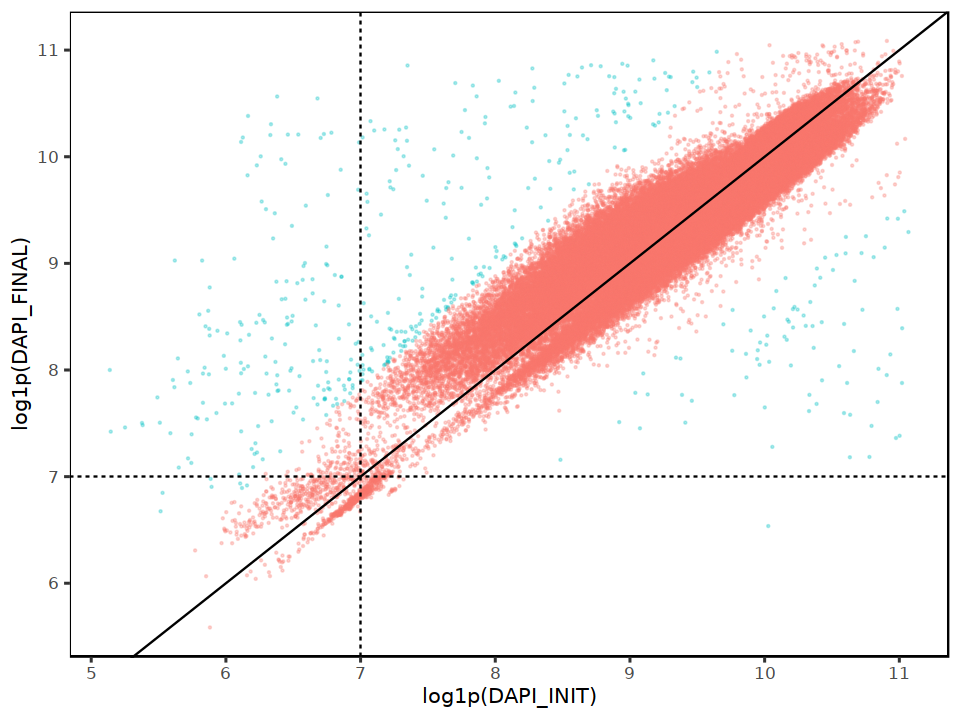

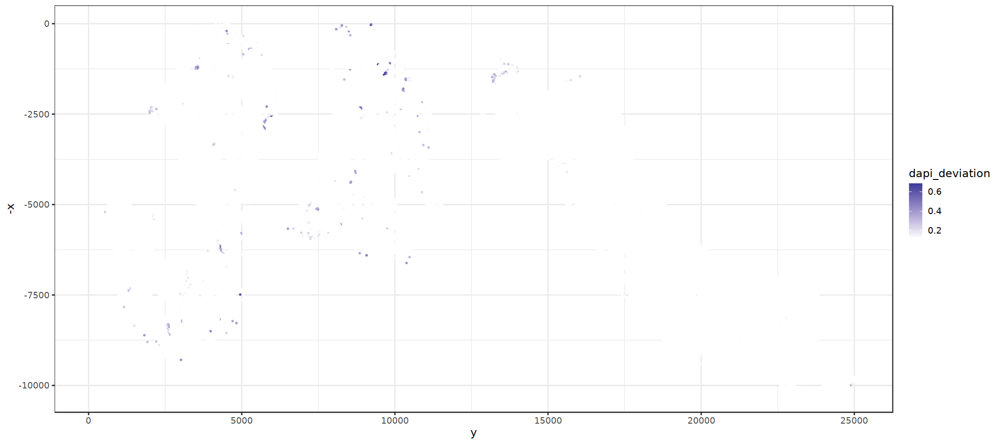

In [12]:
fig.size(6, 8)
cells$intensity_norm %>% 
    cbind(cells$metadata) %>% 
    ggplot(aes(log1p(DAPI_INIT), log1p(DAPI_FINAL), color = dapi_deviation > .12)) + 
        geom_point(size = .2, alpha = .3) + 
        geom_abline() + 
        guides(color = 'none') + 
        geom_hline(yintercept=7, linetype=2) + 
        geom_vline(xintercept=7, linetype=2) + 
        NULL


fig.size(8, 18)
cells$metadata %>% 
    ggplot(aes(y, -x)) + 
        geom_point(size=.5, aes(color = dapi_deviation)) + 
        theme_bw(base_size = 14) + 
        scale_color_gradient2(midpoint = .12, low='white', mid = 'white') + 
        NULL



In [13]:
idx_keep <- which(cells$metadata$dapi_deviation < .12)
cells$metadata <- cells$metadata[idx_keep, ]
cells$intensity <- cells$intensity[idx_keep, ]
cells$intensity_norm <- cells$intensity_norm[idx_keep, ]


## QC cells on area

Here, each pixel is 0.3225 um/pixel, or 0.10400625 um^2/pixel

Nucleus is ~5-10 um, or 25 to 100 um^2. 


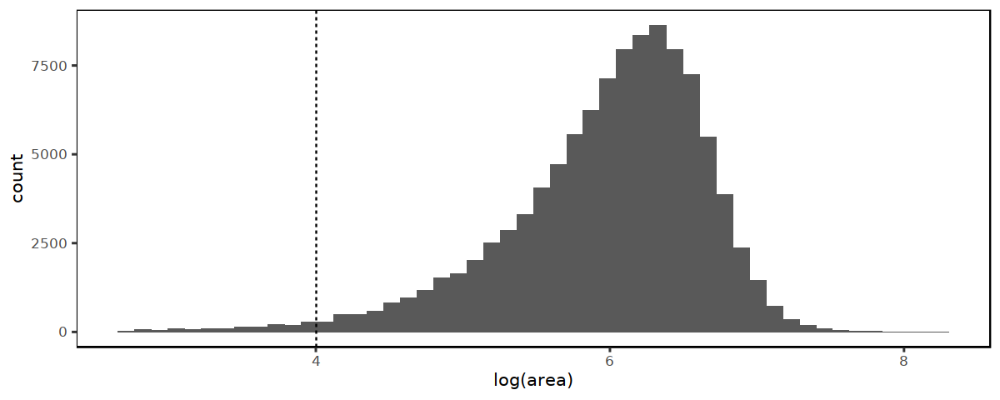

In [14]:
fig.size(4, 10)
cells$metadata %>% 
    ggplot(aes(log(area))) + 
        geom_histogram(bins = 50) + 
        geom_vline(xintercept = 4, linetype = 2) + 
        NULL


In [15]:
idx_keep <- which(log(cells$metadata$area) > 4)
cells$metadata <- cells$metadata[idx_keep, ]
cells$intensity <- cells$intensity[idx_keep, ]
cells$intensity_norm <- cells$intensity_norm[idx_keep, ]


## Number of cells post-QC 

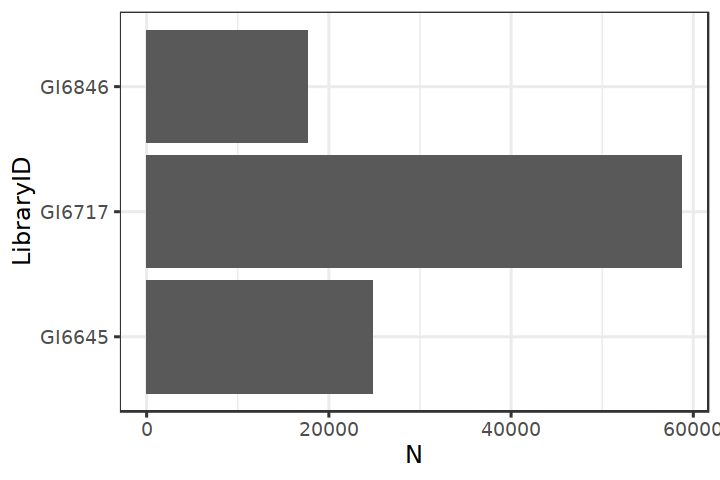

In [216]:
fig.size(4, 6)
data.table(cells$metadata)[, .N, by = LibraryID] %>% 
    ggplot(aes(LibraryID, N)) + 
        geom_bar(stat = 'identity') + 
        coord_flip() + 
        theme_bw(base_size = 14) + 
        NULL


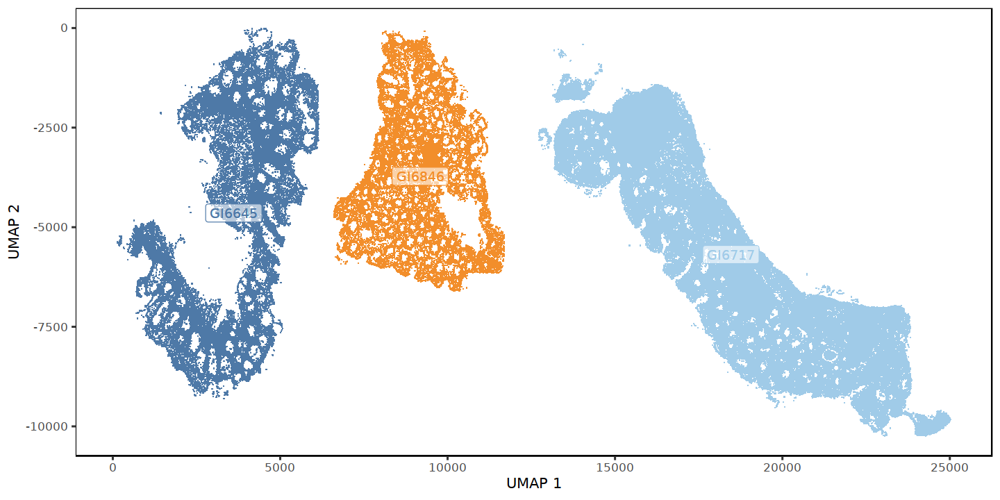

In [217]:
fig.size(6, 12)
do_scatter(data.frame(x = cells$metadata$y, y = -cells$metadata$x), cells$metadata, 'LibraryID')

## QC channels

In [16]:
channels_keep <- setdiff(colnames(cells$intensity), c('PSTAT1', 'CD11C', 'CD34', 'PANCADHERIN', 'CDH11', 'DAPI_INIT', 'DAPI_FINAL', 'MERTK')) ## these are very low quality 
cells$intensity <- cells$intensity[, channels_keep]
cells$intensity_norm <- cells$intensity_norm[, channels_keep]


## Viz channels (density)

In [74]:
cells <- do_scale(cells, z_thresh=3, within_batch=TRUE)

SCALE



Picking joint bandwidth of 0.103

Picking joint bandwidth of 0.107



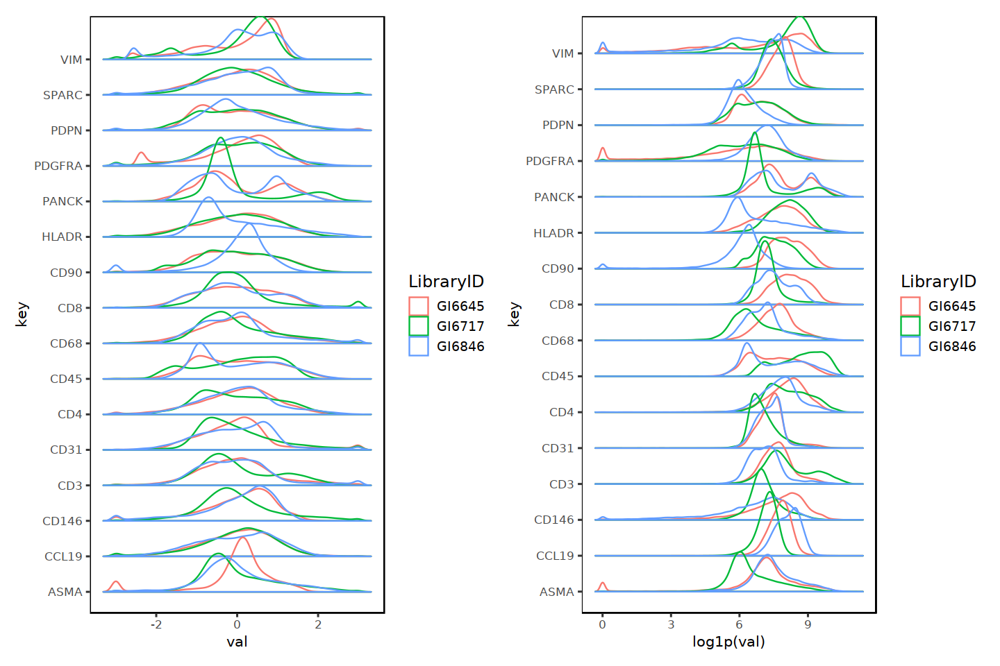

In [75]:
fig.size(8, 12)
cells$z %>% 
    data.frame() %>% 
    tibble::rownames_to_column('CellID') %>% 
    cbind(LibraryID = cells$metadata$LibraryID) %>% 
    tidyr::gather(key, val, all_of(colnames(cells$intensity_norm))) %>% 
    ggplot(aes(val, key, color = LibraryID)) + 
        geom_density_ridges2(fill = NA) + 
        NULL |  
cells$intensity_norm %>% 
    tibble::rownames_to_column('CellID') %>% 
    cbind(LibraryID = cells$metadata$LibraryID) %>% 
    tidyr::gather(key, val, all_of(colnames(cells$intensity_norm))) %>% 
    ggplot(aes(log1p(val), key, color = LibraryID)) + 
        geom_density_ridges2(fill = NA) + 
        NULL 


## Viz intensities (space)

In [78]:
# fig.size(12, 18)
# features_plot <- colnames(cells$intensity_norm)
# suppressWarnings({
#     plotFeatures(
#         log1p(t(cells$intensity_norm)), 
#         data.frame(x = cells$metadata$y, y = -cells$metadata$x), 
#         features_plot, 
#         nrow = floor(sqrt(length(features_plot))),
#         no_guide = TRUE, 
#         empty_theme = TRUE
#     )    
# })


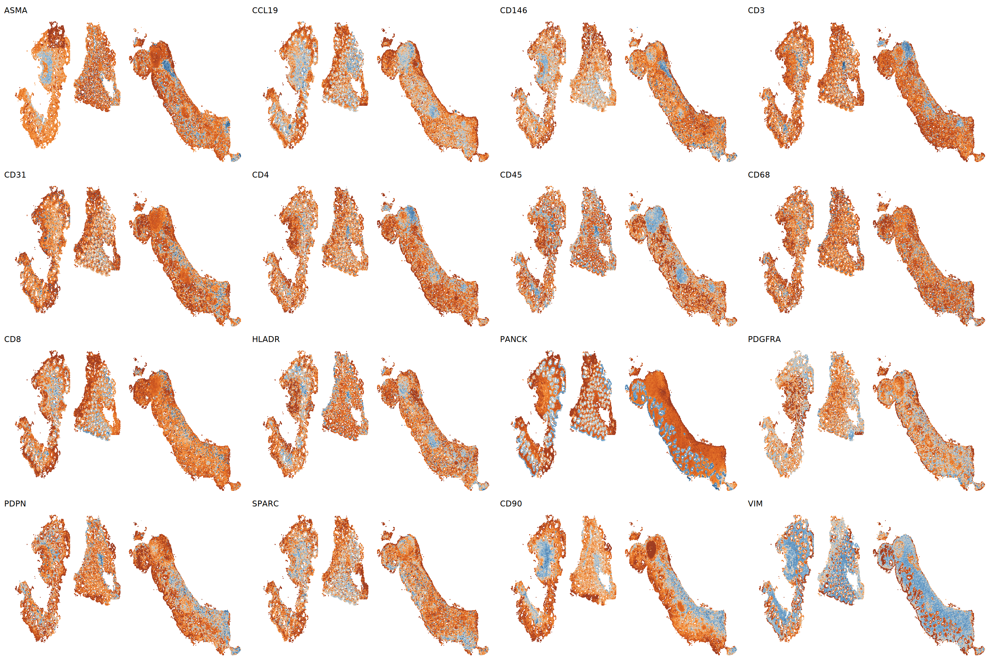

In [77]:
fig.size(16, 24)
features_plot <- colnames(cells$intensity_norm)
suppressWarnings({
    plotFeatures(
        t(cells$z), 
        data.frame(x = cells$metadata$y, y = -cells$metadata$x), 
        features_plot, 
        nrow = floor(sqrt(length(features_plot))),
        no_guide = TRUE, 
        empty_theme = TRUE
    )    
})


## Cache

In [80]:
saveRDS(cells, '../../data/CellDive/results/gut_cells.rds')

# Niche analysis

In [86]:
cells <- readRDS('../../data/CellDive/results/gut_cells.rds')
spots <- make_spots(cells)

## PCA -> UMAP -> Harmony -> UMAP

UMAP

UMAP

PCA

use_weights



[1] FALSE


use_weights

use_weights



[1] FALSE


use_weights

Warning message:
“Quick-TRANSfer stage steps exceeded maximum (= 5056950)”
Warning message:
“Quick-TRANSfer stage steps exceeded maximum (= 5056950)”
Harmony 1/10

Harmony 2/10

Harmony 3/10

Harmony 4/10

Harmony 5/10

Harmony 6/10

Harmony 7/10

Harmony 8/10

Harmony 9/10

Harmony 10/10



    user   system  elapsed 
1427.807 2872.403  589.800 

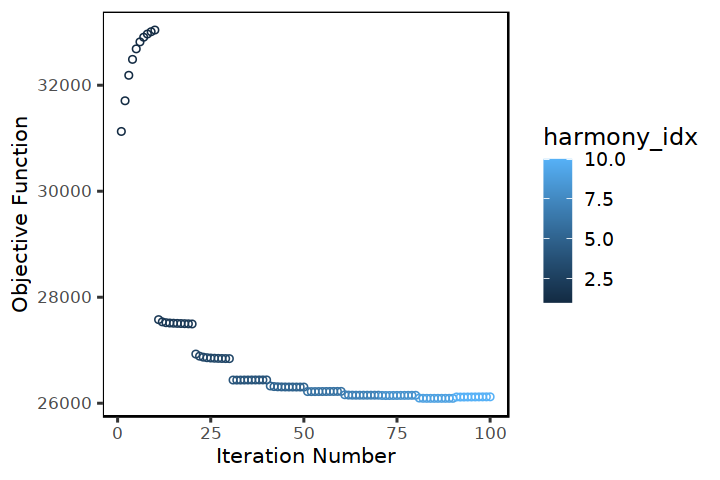

In [121]:
system.time({
    spots <- spots %>% 
        do_norm() %>% 
        do_scale(3, TRUE) %>% 
        do_pca() %>% 
        do_umap('V', 'U0') %>% 
        harmonize() %>% 
        do_umap('H', 'U1') %>% 
        identity()
})


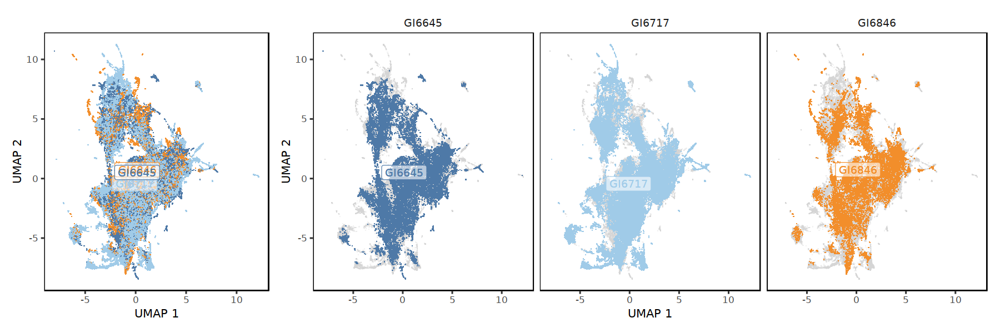

In [177]:
fig.size(5, 15)
(
    do_scatter(spots$U1$embedding, spots$metadata, 'LibraryID') | 
    do_scatter(spots$U1$embedding, spots$metadata, 'LibraryID', quo(LibraryID)) 
) + 
plot_layout(widths = c(1, 3))



## Viz intensities

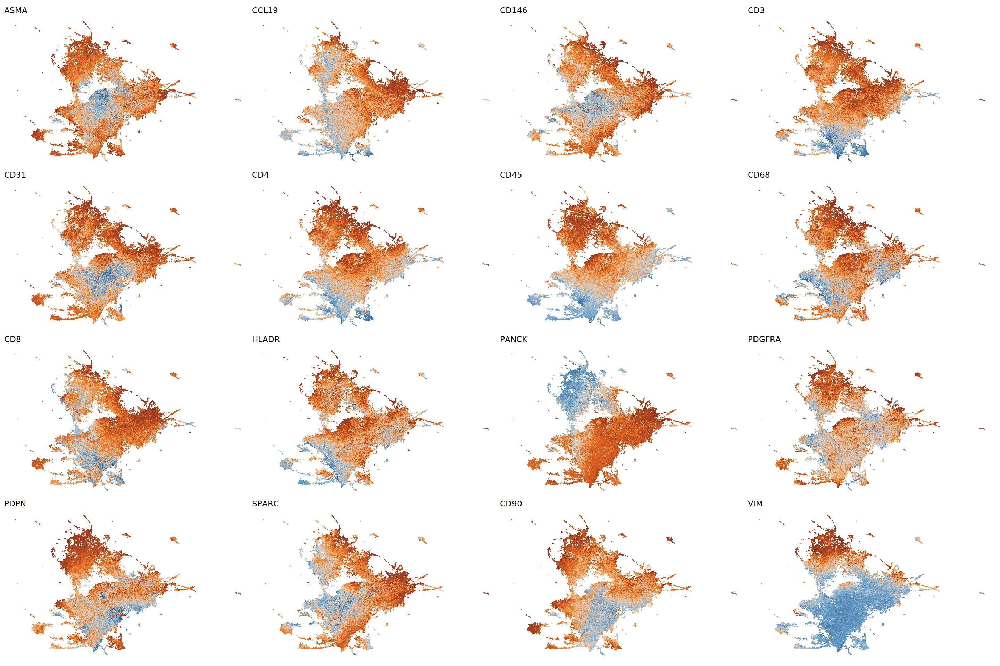

In [130]:
fig.size(16, 24)
features_plot <- colnames(spots$z)
suppressWarnings({
    plotFeatures(
        t(spots$z), 
        spots$U1$embedding, 
        features_plot, 
        nrow = floor(sqrt(length(features_plot))),
        no_guide = TRUE, 
        empty_theme = TRUE
    )    
})


## Cluster

In [160]:
system.time({
    spots <- spots %>% 
        do_louvain('U1', c(.1, .4, .8, 1.2)) %>% 
        do_markers()
})


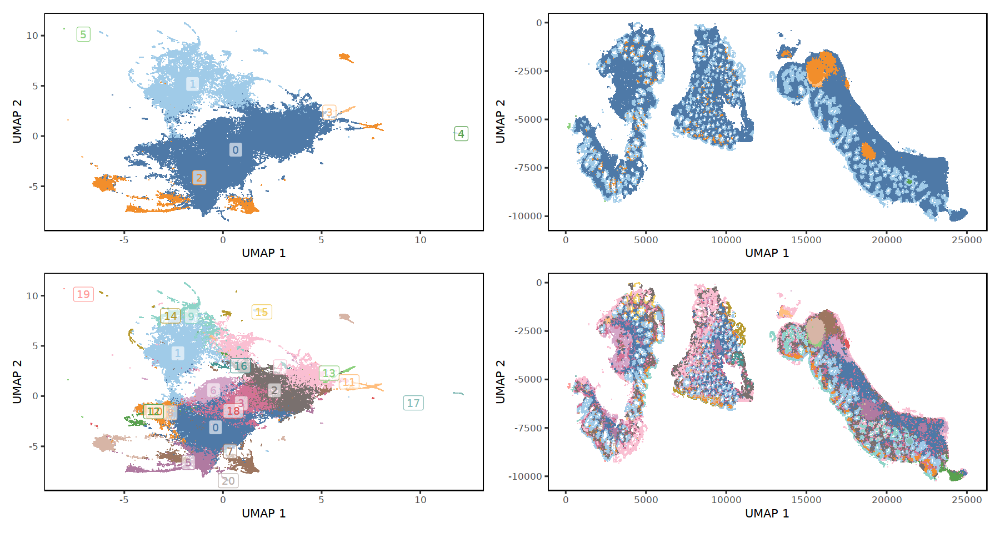

In [191]:
## Only plot up to 33 colors 
clusters_plot <- names(which(spots$Clusters %>% map(table) %>% map_int(length) <= length(colors_overload)))
fig.size(4 * length(clusters_plot), 15)
map(clusters_plot, function(.name) {
    do_scatter(spots$U1$embedding, spots$Clusters, .name) |
    do_scatter(data.frame(x = spots$metadata$y, y = -spots$metadata$x), spots$Clusters, .name, do_labels = FALSE)
}) %>% 
    reduce(`/`)


In [193]:
# fig.size(18, 18)
# do_scatter(spots$U1$embedding, spots$metadata, 'Cluster', quo(Cluster), do_labels=FALSE, nrow=5)


In [205]:
# fig.size(4, 10)
# X <- mres %>% 
#     subset(feature %in% c('ACTA2', 'CD146', 'CD3', 'CD31', 'CD45', 'CD68', 'PANCK')) %>% 
#     subset(!group %in% c('C22')) %>% 
#     dplyr::select(SCORE=auc, feature, group) %>% 
#     tidyr::spread(group, SCORE) %>% 
#     tibble::column_to_rownames('feature') %>% 
#     as('matrix') 
# # o <- order(as.integer(gsub('C', '', colnames(X))))
# # Heatmap(X[, o], cluster_columns = FALSE)
# # X <- X %>% t %>% scale %>% t %>% scale
# Heatmap(X, column_names_rot = 45)


## Cache

In [206]:
saveRDS(spots, '../../data/CellDive/results/gut_spots.rds')

# Cell analysis

Now let's find those fibroblasts! 


In [207]:
cells <- readRDS('../../data/CellDive/results/gut_cells.rds')


## PCA -> UMAP -> Harmony -> UMAP

UMAP

UMAP

PCA

SCALE

use_weights



[1] FALSE


use_weights

use_weights



[1] FALSE


use_weights

Warning message:
“Quick-TRANSfer stage steps exceeded maximum (= 5056950)”
Warning message:
“Quick-TRANSfer stage steps exceeded maximum (= 5056950)”
Harmony 1/10

Harmony 2/10

Harmony 3/10

Harmony 4/10

Harmony 5/10

Harmony 6/10

Harmony 7/10

Harmony 8/10

Harmony 9/10

Harmony 10/10



    user   system  elapsed 
1328.655 2726.501  560.497 

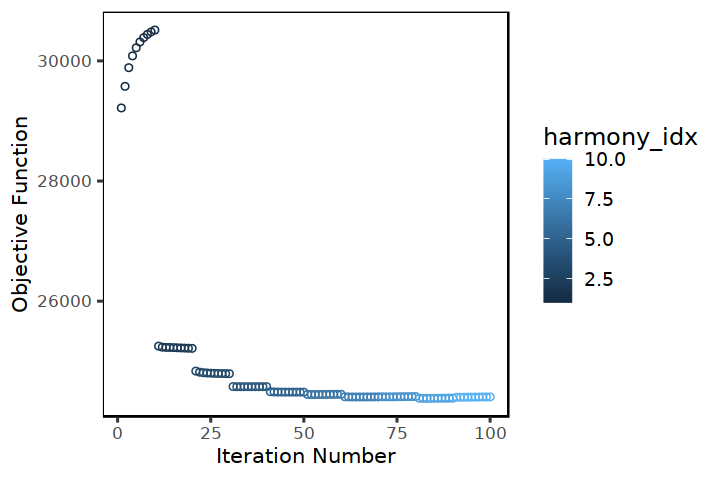

In [208]:
system.time({
    cells <- cells %>% 
        do_norm() %>% 
        do_scale(3, TRUE) %>% 
        do_pca() %>% 
        do_umap('V', 'U0') %>% 
        harmonize() %>% 
        do_umap('H', 'U1') %>% 
        identity()
})


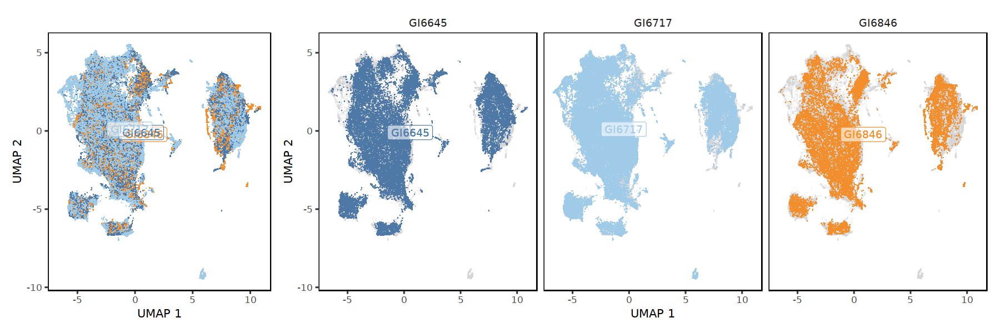

In [210]:
fig.size(5, 15)
with(cells, {
    (
        do_scatter(U1$embedding, metadata, 'LibraryID') | 
        do_scatter(U1$embedding, metadata, 'LibraryID', quo(LibraryID)) 
    ) + 
    plot_layout(widths = c(1, 3))
})


## Viz intensities

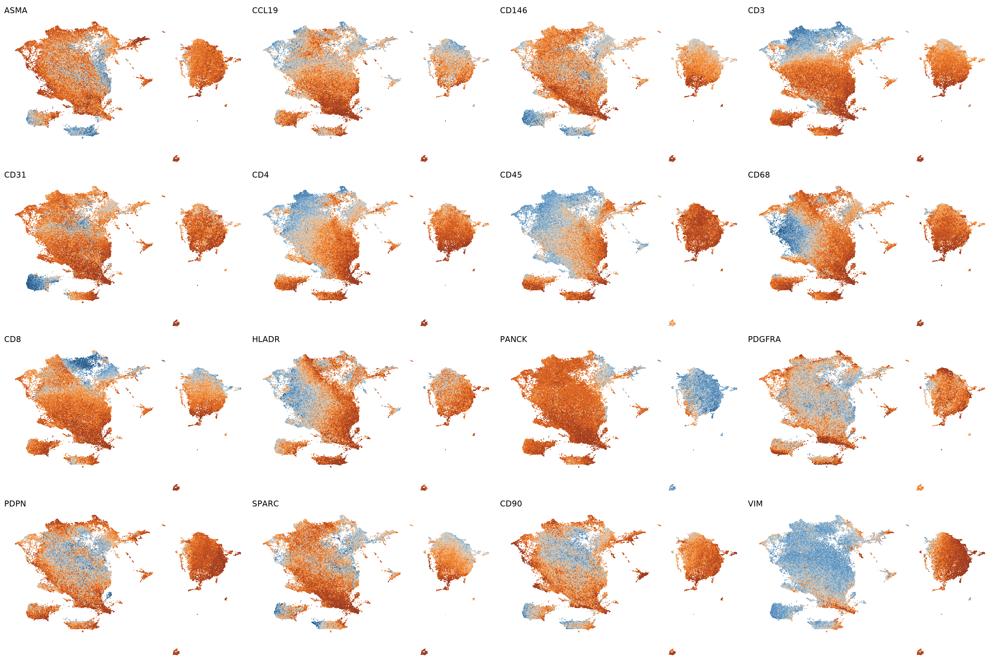

In [215]:
fig.size(16, 24)
features_plot <- colnames(cells$z)
suppressWarnings({
    plotFeatures(
        t(cells$z), 
        cells$U1$embedding, 
        features_plot, 
        nrow = floor(sqrt(length(features_plot))),
        no_guide = TRUE, 
        empty_theme = TRUE
    )    
})


## Cluster

In [211]:
system.time({
    cells <- cells %>% 
        do_louvain('U1', c(.1, .4, .8, 1.2)) %>% 
        do_markers()
})


Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 101139
Number of edges: 1061083

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9285
Number of communities: 5
Elapsed time: 39 seconds


Warning message:
“UNRELIABLE VALUE: Future (‘<none>’) unexpectedly generated random numbers without specifying argument 'seed'. There is a risk that those random numbers are not statistically sound and the overall results might be invalid. To fix this, specify 'seed=TRUE'. This ensures that proper, parallel-safe random numbers are produced via the L'Ecuyer-CMRG method. To disable this check, use 'seed=NULL', or set option 'future.rng.onMisuse' to "ignore".”


Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 101139
Number of edges: 1061083

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8574
Number of communities: 12
Elapsed time: 42 seconds


Warning message:
“UNRELIABLE VALUE: Future (‘<none>’) unexpectedly generated random numbers without specifying argument 'seed'. There is a risk that those random numbers are not statistically sound and the overall results might be invalid. To fix this, specify 'seed=TRUE'. This ensures that proper, parallel-safe random numbers are produced via the L'Ecuyer-CMRG method. To disable this check, use 'seed=NULL', or set option 'future.rng.onMisuse' to "ignore".”


Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 101139
Number of edges: 1061083

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8225
Number of communities: 22
Elapsed time: 51 seconds


Warning message:
“UNRELIABLE VALUE: Future (‘<none>’) unexpectedly generated random numbers without specifying argument 'seed'. There is a risk that those random numbers are not statistically sound and the overall results might be invalid. To fix this, specify 'seed=TRUE'. This ensures that proper, parallel-safe random numbers are produced via the L'Ecuyer-CMRG method. To disable this check, use 'seed=NULL', or set option 'future.rng.onMisuse' to "ignore".”


Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 101139
Number of edges: 1061083

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8010
Number of communities: 30
Elapsed time: 50 seconds


Warning message:
“UNRELIABLE VALUE: Future (‘<none>’) unexpectedly generated random numbers without specifying argument 'seed'. There is a risk that those random numbers are not statistically sound and the overall results might be invalid. To fix this, specify 'seed=TRUE'. This ensures that proper, parallel-safe random numbers are produced via the L'Ecuyer-CMRG method. To disable this check, use 'seed=NULL', or set option 'future.rng.onMisuse' to "ignore".”
New names:
* NA -> ...1
* NA -> ...2
* NA -> ...3
* NA -> ...4



   user  system elapsed 
185.888   3.078  53.786 

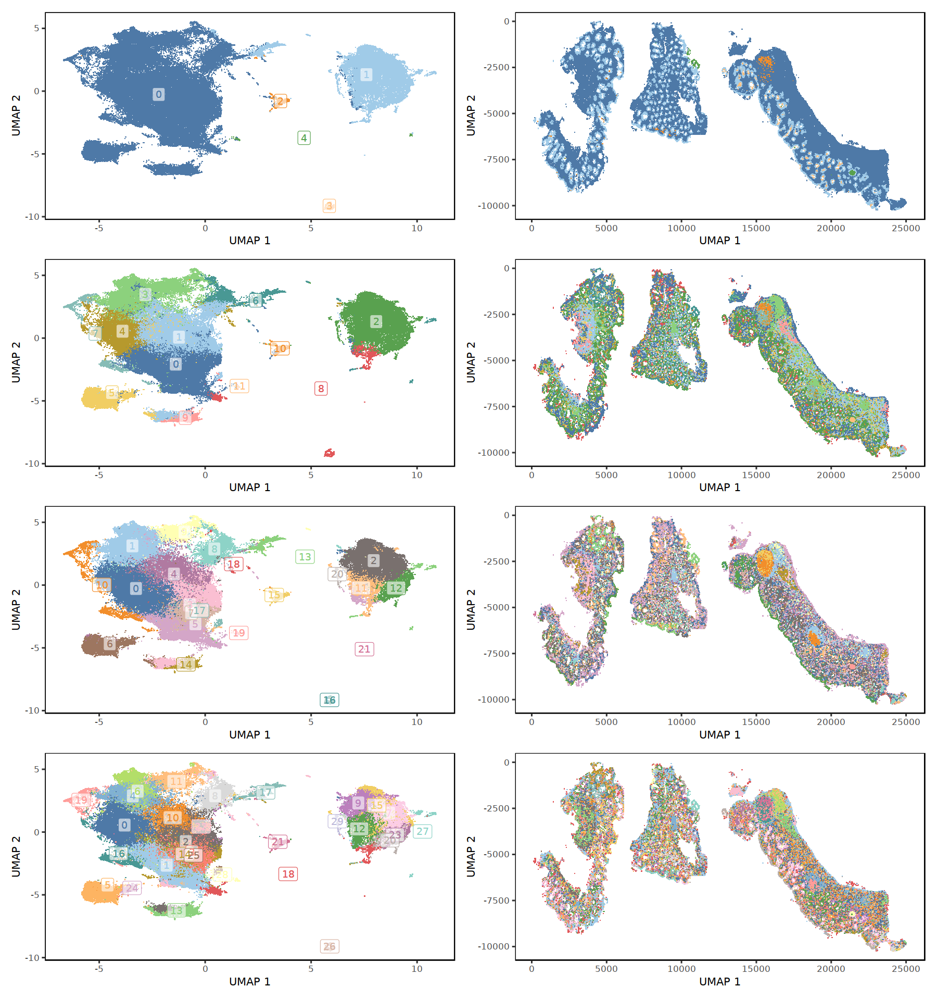

In [212]:
## Only plot up to 33 colors 
with(cells, {
    clusters_plot <- names(which(Clusters %>% map(table) %>% map_int(length) <= length(colors_overload)))
    fig.size(4 * length(clusters_plot), 15)
    map(clusters_plot, function(.name) {
        do_scatter(U1$embedding, Clusters, .name) |
        do_scatter(data.frame(x = metadata$y, y = -metadata$x), Clusters, .name, do_labels = FALSE)
    }) %>% 
        reduce(`/`)
    
})


## Cache

In [213]:
saveRDS(cells, '../../data/CellDive/results/gut_cells.rds')

# ETC outliers

PDGFRA low-intensity outliers may be causing a problem. Can we fix it with quantile normalization or something? 


In [275]:
# # quants <- cells$metadata %>% 
# #     cbind(cells$intensity_norm) %>% 
# #     subset(LibraryID == 'GI6645') %>% 
# #     with(quantile(log1p(PDGFRA), c(.1)))
# # quants
# quants <- data.table(cbind(cells$metadata, cells$intensity_norm))[, .(quant = quantile(log1p(PDGFRA), .1)), by = .(LibraryID)]
# quants
# fig.size(6, 8)
# cells$metadata %>% 
#     cbind(cells$intensity_norm) %>% 
#     # subset(LibraryID == 'GI6645') %>% 
#     ggplot(aes(log1p(PDGFRA), color = LibraryID)) + 
#         geom_density() + 
#         # geom_vline(xintercept = quants, linetype = 2) + 
#         geom_vline(data = quants, aes(xintercept = quant), linetype = 2) + 
#         labs(title = 'Safe to say that 10% of cells should be negative') + 
#         NULL


In [276]:
# cells$metadata %>% 
#     cbind(cells$intensity_norm) %>% 
#     subset(LibraryID == 'GI6645') %>% 
#     # with(mean(log1p(PDGFRA)))
#     with(var(log1p(PDGFRA)))


# What should we do with these? 

# Some kind of parametric quantile mapping? 


# y <- cells$metadata %>% 
#     cbind(cells$intensity_norm) %>% 
#     subset(LibraryID == 'GI6645') %>% 
#     # with(mean(log1p(PDGFRA)))
#     with(log1p(PDGFRA))


# 5.714
# 5.735